In [1]:
import pickle
import pandas as pd
import numpy as np

import streamlit as st
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler

# Load Data

In [129]:
def load_data():
    with open('data/ev.pickle', 'rb') as f:
        ev = pickle.load(f)
    with open('data/ev_merged.pickle', 'rb') as f:
        ev_merged = pickle.load(f)
    with open('data/ev_state.pickle', 'rb') as f:
        ev_state = pickle.load(f)
    return ev, ev_merged, ev_state

ev, ev_merged, ev_state = load_data()

- Now test visualizations for Streamlit

---
# 1. Overview of EV Adoption in Washington

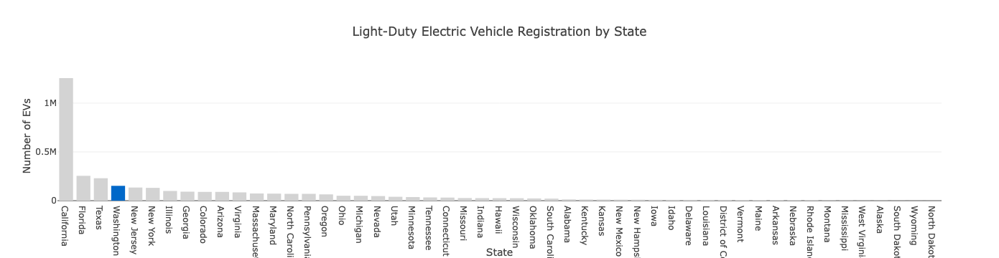

In [32]:
# 1-1) Light-Duty Electric Vehicle Registration by State
ev_state['state_category'] = np.where(ev_state['state'] == 'Washington', 'Washington', 'Other')

fig_state = px.bar(ev_state
                   , x='state'
                   , y='registration_count'
                   , title='Light-Duty Electric Vehicle Registration by State'
                   , color='state_category'  # Use the color column to set the bar colors
                   , color_discrete_map={'Other':'lightgray', 'Washington':'#0068C9'}  # Define color map
                   , category_orders={'state': ev_state['state']})  # Maintain the original order of 'state'
fig_state.update_xaxes(title='State')  # Update axis labels
fig_state.update_yaxes(title='Number of EVs')
fig_state.update_layout(showlegend=False)
fig_state.show()

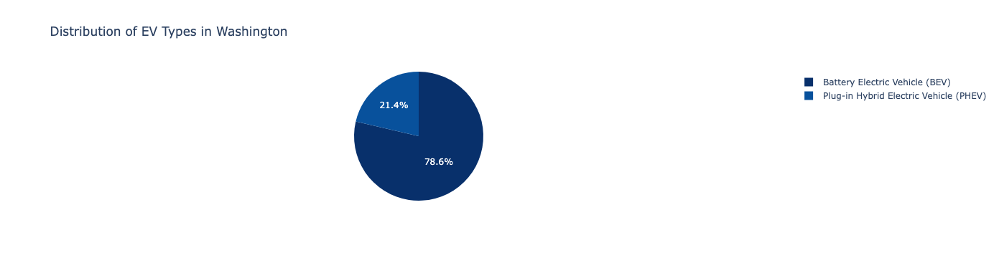

In [33]:
# 1-2) EV Type Distribution
fig_ev_type = px.pie(ev
                     , names='ev_type'
                     , title='Distribution of EV Types in Washington'
                     , color_discrete_sequence=px.colors.sequential.Blues_r  # Color scheme added
                    )
fig_ev_type.update_layout(template='plotly_white') 
fig_ev_type.show()

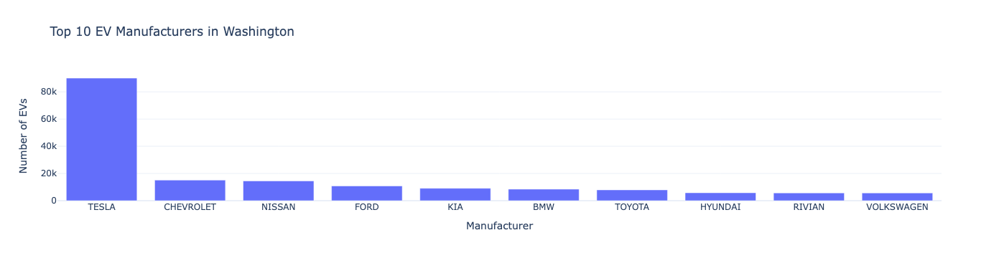

In [130]:
# 1-3) Top EV Manufacturers
top_manufacturers = ev['make'].value_counts().nlargest(10)
fig_manufacturers = px.bar(top_manufacturers
                           , x=top_manufacturers.index
                           , y=top_manufacturers.values
                           , title='Top 10 EV Manufacturers in Washington'
                           , color_discrete_sequence=px.colors.qualitative.Plotly
                          )
fig_manufacturers.update_xaxes(title='Manufacturer')
fig_manufacturers.update_yaxes(title='Number of EVs')
fig_manufacturers.update_layout(template='plotly_white')
fig_manufacturers.show()

In [167]:
top_manufacturers = ev['make'].value_counts().nlargest(10)
print(top_manufacturers)
top_manufacturers_names = top_manufacturers.index
top_manufacturers_counts = top_manufacturers.values

# Calculate average electric range for the top manufacturers
cond = (ev['electric_range'] != 0.0) \
    & (ev['electric_range'].isna() == False) \
    # & (ev['make'].isin(top_manufacturers_names))
    # Exclude 0
avg_electric_range = ev[cond].groupby('make')['electric_range'].mean()

top_maker_with_range = top_manufacturers_names[top_manufacturers_names.isin(avg_electric_range.index)]
avg_electric_range = avg_electric_range[top_maker_with_range]

avg_electric_range

make
TESLA         90099
CHEVROLET     15086
NISSAN        14513
FORD          10811
KIA            9094
BMW            8467
TOYOTA         7920
HYUNDAI        5773
RIVIAN         5667
VOLKSWAGEN     5625
Name: count, dtype: int64


make
TESLA         241.097010
CHEVROLET     141.649067
NISSAN        104.908244
FORD           25.581684
KIA            84.219715
BMW            46.373193
TOYOTA         31.077032
HYUNDAI        84.200658
VOLKSWAGEN    107.369403
Name: electric_range, dtype: float64

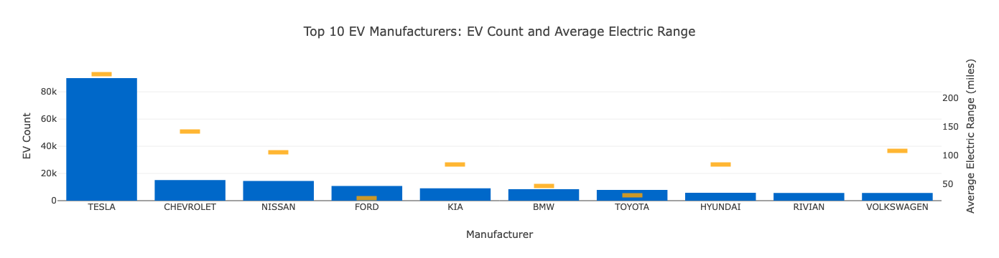

In [168]:
# Top EV Manufacturers with their avg electric range

import plotly.graph_objects as go

top_manufacturers = ev['make'].value_counts().nlargest(10)
top_manufacturers_names = top_manufacturers.index
top_manufacturers_counts = top_manufacturers.values

# Calculate average electric range for the top manufacturers
cond = (ev['electric_range'] != 0.0) \
    & (ev['electric_range'].isna() == False) \
    # & (ev['make'].isin(top_manufacturers_names))
    # Exclude 0
avg_electric_range = ev[cond].groupby('make')['electric_range'].mean()

top_manufacturers_with_range = top_manufacturers_names[top_manufacturers_names.isin(avg_electric_range.index)]
avg_electric_range = avg_electric_range[top_manufacturers_with_range]

# Create a figure
fig = go.Figure()

# Add EV count bar (main y-axis)
fig.add_trace(go.Bar(
    x=top_manufacturers_names,
    y=top_manufacturers_counts,
    name='EV Count',
    marker_color='#0068C9',
    yaxis='y' # Main y-axis
))

# Update layout
# Add secondar y-axis for average electric range marker
fig.update_layout(
    title='Top 10 EV Manufacturers: EV Count and Average Electric Range',
    xaxis_title='Manufacturer',
    yaxis_title='EV Count',
    # Secondary y-axis
    yaxis2=dict(
        title='Average Electric Range (miles)',
        overlaying='y',
        side='right',
        showgrid=False, # Disable grid for secondary y-axis
        zeroline=False, # Disable zero line for clarity
    ),
    legend=dict(title='Metrics'),
    barmode='group', # Keep this to avoid bars overlapping
)

# Add average electric range annotations as "markers" (secondary y-axis)
for x, y in zip(avg_electric_range.index, avg_electric_range.values):
    fig.add_annotation(
        x=x,
        y=y,
        text="", # Empty text to create a marker effect
        showarrow=False,
        bgcolor='orange', # Marker color
        height=3, # Height of the annotation
        width=25, # Width of the annotation
        font=dict(color='orange'),
        # bordercolor='black', # Border color for better visibility
        # borderwidth=1, # Border width for better visibility
        opacity=0.8, # Adjust opacity
        yref='y2' # At secondary y-axis
    )

fig.show()

---
# 2. EV Adoption Trends

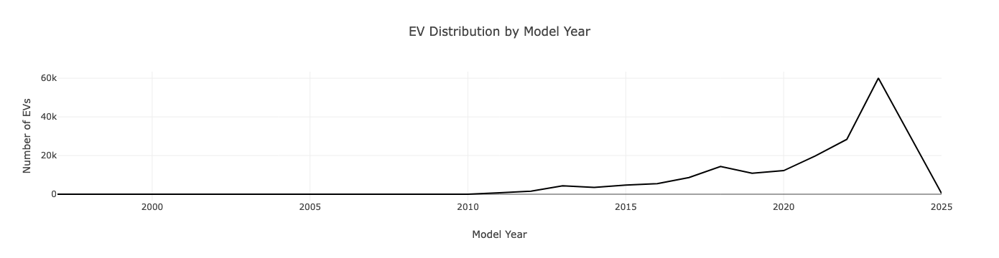

In [35]:
# 2-1) EV Adoption by Model Year
ev_by_year = ev['model_year'].value_counts().sort_index()
fig_adoption = px.line(x=ev_by_year.index, 
                       y=ev_by_year.values, 
                       title='EV Distribution by Model Year')
fig_adoption.update_xaxes(title='Model Year')
fig_adoption.update_yaxes(title='Number of EVs')
fig_adoption.show()

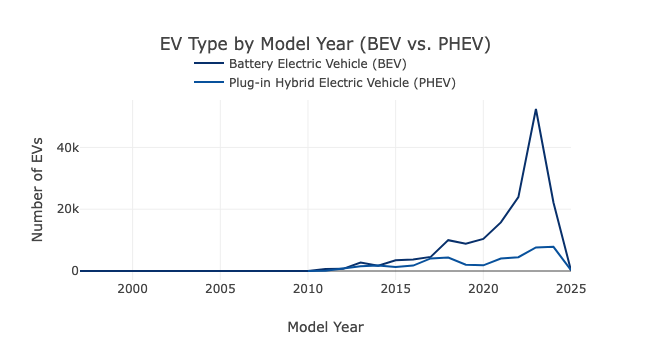

In [36]:
# 2-2) EV Type by Model Year
model_counts = ev.groupby(['model_year', 'ev_type']).size().reset_index(name='count')
fig_type = px.line(model_counts, 
                   x='model_year', 
                   y='count', 
                   color='ev_type', 
                   title='EV Type by Model Year (BEV vs. PHEV)',
                   color_discrete_sequence=px.colors.sequential.Blues_r
                  )

# Legend setting
fig_type.update_layout(
    showlegend=True,
    legend=dict(
        orientation='h', # Horizontal orientation
        yanchor='bottom', # Anchor the legend to the bottom
        y=1.02, # Position it above the chart
        xanchor='center', # Anchor the legend to the center
        x=0.5, # Center the legend horizontally
        title=None # Hide the legend title
    )
)
fig_type.update_xaxes(title='Model Year')
fig_type.update_yaxes(title='Number of EVs')
fig_type.show()

---
# 3. Economic Analysis

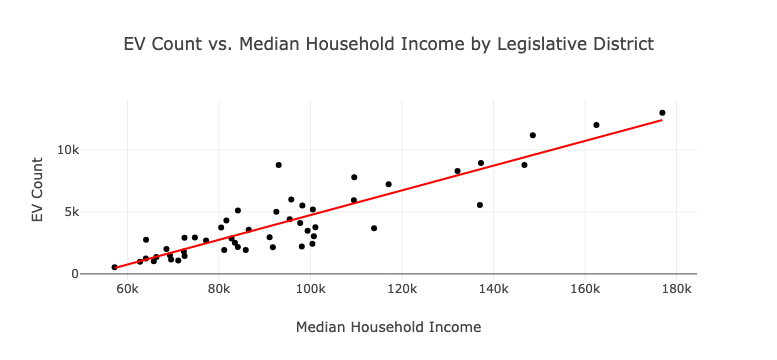

In [169]:
# EV Count vs. Median Household Income by Legislative District
fig_income = px.scatter(ev_merged,
                        x='median_household_income',
                        y='ev_count',
                        title='EV Count vs. Median Household Income by Legislative District',
                        hover_data=['legislative_district'],
                        trendline='ols',
                        trendline_color_override='red'
                       )

fig_income.update_xaxes(title='Median Household Income')
fig_income.update_yaxes(title='EV Count')

fig_income.show()

---
# 4. Charging Infrastructure Analysis

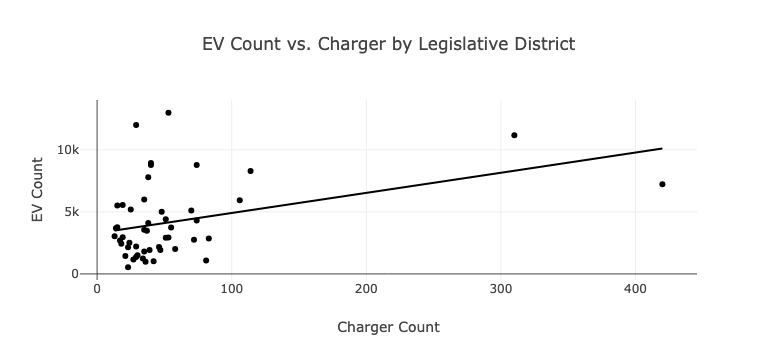

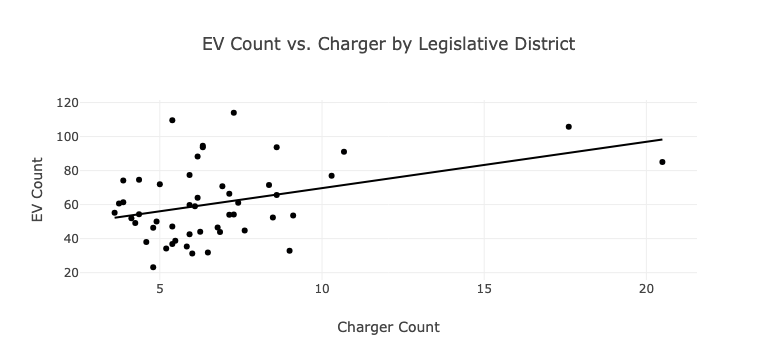

In [174]:
# EV Count vs. Charger by Legislative District
fig_charger = px.scatter(ev_merged,
                         x='charger_count',
                         y='ev_count',
                         hover_data=['legislative_district'],
                         title='EV Count vs. Charger by Legislative District',
                         trendline='ols')

fig_charger.update_xaxes(title='Charger Count')
fig_charger.update_yaxes(title='EV Count')
fig_charger.show()

# Scaled
fig_charger = px.scatter(ev_merged,
                         x='transformed_charger_count',
                         y='transformed_ev_count',
                         hover_data=['legislative_district'],
                         title='EV Count vs. Charger by Legislative District',
                         trendline='ols')
fig_charger.update_xaxes(title='Charger Count')
fig_charger.update_yaxes(title='EV Count')
fig_charger.show()

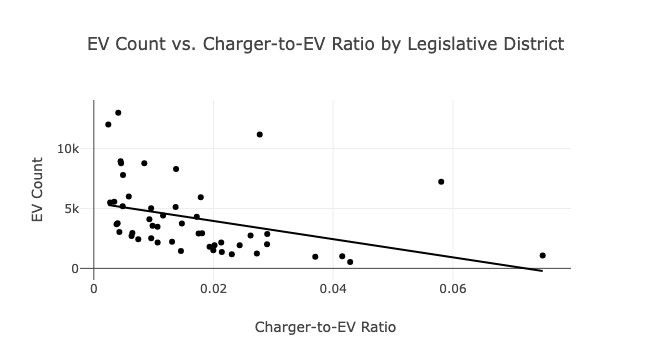

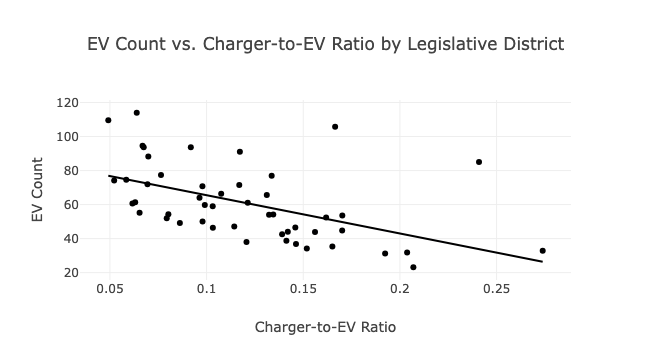

In [51]:
# EV Count vs. Charger-to-EV Ratio by Legislative District
fig_charger = px.scatter(ev_merged,
                         x='charger_ev_ratio',
                         y='ev_count',
                         hover_data=['legislative_district'],
                         title='EV Count vs. Charger-to-EV Ratio by Legislative District',
                         trendline='ols')
fig_charger.update_xaxes(title='Charger-to-EV Ratio')
fig_charger.update_yaxes(title='EV Count')
fig_charger.show()

# Scaled
fig_charger = px.scatter(ev_merged,
                         x='transformed_charger_ev_ratio',
                         y='transformed_ev_count',
                         hover_data=['legislative_district'],
                         title='EV Count vs. Charger-to-EV Ratio by Legislative District',
                         trendline='ols')
fig_charger.update_xaxes(title='Charger-to-EV Ratio')
fig_charger.update_yaxes(title='EV Count')
fig_charger.show()

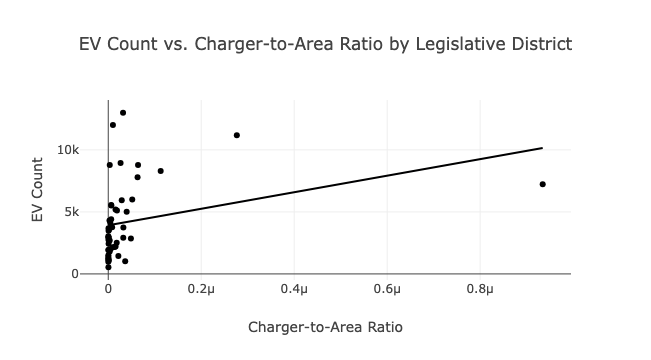

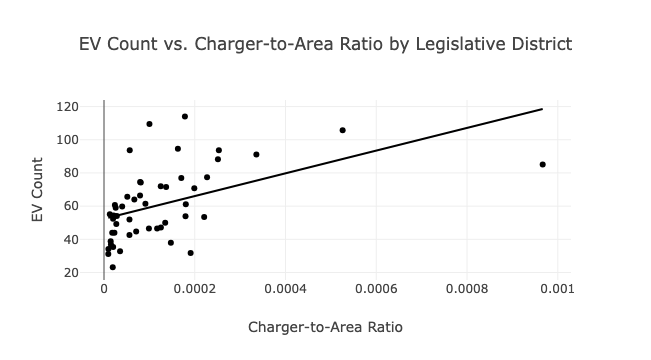

In [52]:
# EV Count vs. Charger-to-Area Ratio by Legislative District
fig_charger = px.scatter(ev_merged,
                         x='charger_density',
                         y='ev_count',
                         hover_data=['legislative_district'],
                         title='EV Count vs. Charger-to-Area Ratio by Legislative District',
                         trendline='ols')
# fig_charger.update_traces(marker=dict(color='#0068C9'))

fig_charger.update_xaxes(title='Charger-to-Area Ratio')
fig_charger.update_yaxes(title='EV Count')
fig_charger.show()

# Scaled
fig_charger = px.scatter(ev_merged,
                         x='transformed_charger_density',
                         y='transformed_ev_count',
                         hover_data=['legislative_district'],
                         title='EV Count vs. Charger-to-Area Ratio by Legislative District',
                         trendline='ols')
fig_charger.update_xaxes(title='Charger-to-Area Ratio')
fig_charger.update_yaxes(title='EV Count')
fig_charger.show()

In [ ]:
# if viz_type == "EV Count vs. Charger by Legislative District":
#     fig_charger = px.scatter(ev_merged_filtered
#                              , x='charger_count'
#                              , y='ev_count'
#                              , hover_data=['legislative_district']
#                              , title='EV Count vs. Charger by Legislative District'
#                              , trendline='ols')
#     fig_charger.update_xaxes(title='Charger Count')
#     fig_charger.update_yaxes(title='EV Count')
    
# elif viz_type == "EV Count vs. Charger-to-EV Ratio by Legislative District":
#     fig_charger = px.scatter(ev_merged_filtered
#                              , x='charger_ev_ratio'
#                              , y='ev_count'
#                              , hover_data=['legislative_district']
#                              , title='EV Count vs. Charger-to-EV Ratio by Legislative District'
#                              , trendline='ols')
#     fig_charger.update_xaxes(title='Charger-to-EV Ratio')
#     fig_charger.update_yaxes(title='EV Count')
# else:
#     fig_charger = px.scatter(ev_merged_filtered
#                              , x='charger_density'
#                              , y='ev_count'
#                              , hover_data=['legislative_district']
#                              , title='EV Count vs. Charger-to-Area Ratio by Legislative District'
#                              , trendline='ols')
#     fig_charger.update_xaxes(title='Charger-to-Area Ratio')
#     fig_charger.update_yaxes(title='EV Count')

---
# 5. Geographic Distribution and Political Landscape

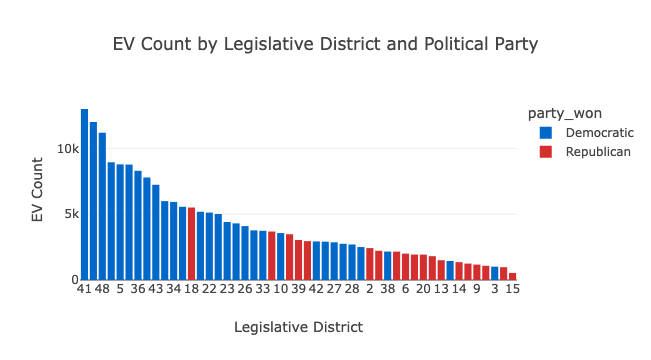

In [43]:
# EV Count by Legislative District and Political Party

# Color mapping
party_colors = {'Democratic': '#0068C9', 'Republican': '#D32F2F'}

ev_merged_sorted = ev_merged.sort_values('ev_count', ascending=False)
fig_pp = px.bar(ev_merged_sorted, 
                x='legislative_district', y='ev_count',
                color='party_won', 
                title='EV Count by Legislative District and Political Party',
                color_discrete_map=party_colors
                ).update_xaxes(type='category', categoryorder='total descending')
fig_pp.update_layout(xaxis_title='Legislative District', yaxis_title='EV Count')
fig_pp.show()

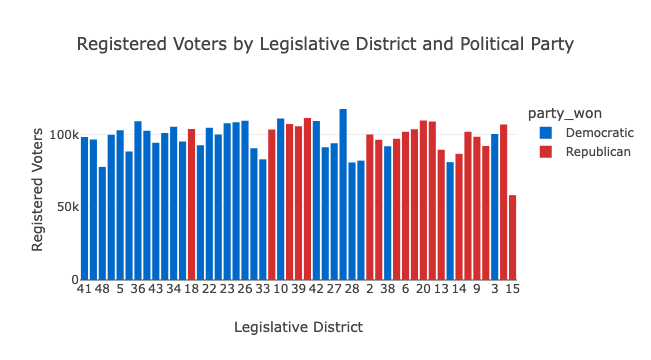

In [44]:
# Registered Voters by Legislative District and Political Party
ev_merged_sorted = ev_merged.sort_values('ev_count', ascending=False)
ld_order = ev_merged_sorted['legislative_district'].tolist()
fig_pp = px.bar(ev_merged_sorted, 
                x='legislative_district', y='registered_voters',
                color='party_won', 
                title='Registered Voters by Legislative District and Political Party',
                color_discrete_map=party_colors, 
                category_orders={'legislative_district': ld_order}
                ).update_xaxes(type='category')
fig_pp.update_layout(xaxis_title='Legislative District', yaxis_title='Registered Voters')
fig_pp.show()

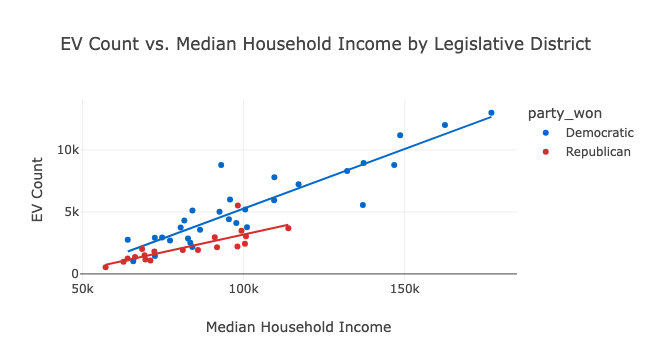

In [46]:
# EV Count vs. Median Household Income
fig_pp = px.scatter(ev_merged, 
                    x='median_household_income', y='ev_count',
                    color='party_won', 
                    title='EV Count vs. Median Household Income by Legislative District',
                    color_discrete_map=party_colors, 
                    hover_data=['legislative_district'], 
                    trendline='ols',
                    trendline_scope='trace')
fig_pp.update_xaxes(title='Median Household Income')
fig_pp.update_yaxes(title='EV Count')
fig_pp.show()

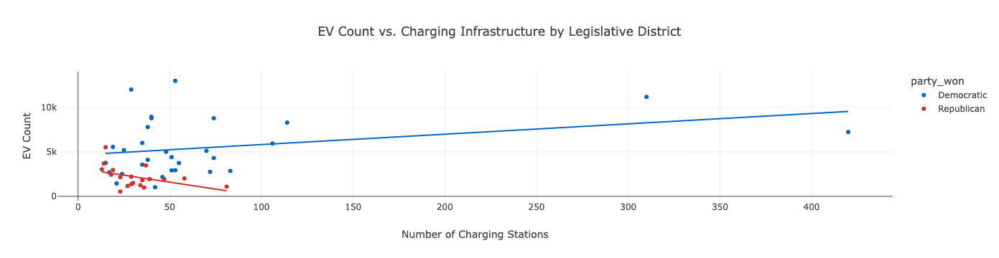

In [48]:
# EV Count vs. Charging Infrastructure by Legislative District
fig_pp = px.scatter(ev_merged, 
                    x='charger_count', y='ev_count',
                    color='party_won', 
                    title='EV Count vs. Charging Infrastructure by Legislative District',
                    color_discrete_map=party_colors, 
                    hover_data=['legislative_district'], 
                    trendline='ols',
                    trendline_scope='trace')
fig_pp.update_xaxes(title='Number of Charging Stations')
fig_pp.update_yaxes(title='EV Count')
fig_pp.show()

# OLS Regression for Trendlines

- OLS regression has been used to calculate regression parameters and draw trendlines
- The codes are in the python(.py) file for Streamlit

In [ ]:
# OLS regression for trendline
def calculate_ols(df, x_col, y_col):
    # Data preparation
    X = sm.add_constant(df[x_col]) # Add constant term for intercept
    y = df[y_col]
    # Get OLS parameters
    model = sm.OLS(y, X).fit()
    slope = model.params[1]
    intercept = model.params[0]
    r_squared = model.rsquared
    return slope, intercept, r_squared

In [ ]:
# OLS regression for trendline
slope, intercept, r_squared = calculate_ols(ev_merged, x_data, y_data)

In [ ]:
ols_equation = f'<br>OLS trendline:<br>y = {slope:.2f}x + {intercept:.2f}<br>R² = {r_squared:.2f}'